In [2]:
from __future__ import absolute_import, division, print_function
#..
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import pyart.graph.cm as pcm
import matplotlib.colors as colors
from matplotlib.colors import LogNorm
from netCDF4 import num2date,date2num,Dataset
import matplotlib._pylab_helpers
#from joblib import Parallel, delayed
import os,subprocess,time,copy
import random
import scipy
import math
import matplotlib.gridspec as gridspec
#import cPickle as pickle
import pickle
import pymc as pm
import arviz as az

#import pymc3
#import pyGPs
#..
import pathlib
import pandas as pd
#import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pytensor
import pytensor.tensor as pt
print(tf.__version__)
print(pm.__version__)
import re
import csv
from io import StringIO
#..
import corner
#..
#import pymc
#import pandas as pd
#print('Running on PyMC3 v{}'.format(pm.__version__))
#import theano
#import theano.tensor as t
%matplotlib inline

2025-02-20 21:40:56.129862: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-20 21:40:56.147044: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740105656.164207 2899663 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740105656.169453 2899663 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-20 21:40:56.189529: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

2.18.0
5.20.1


# K1D BOSS single-cat PPE->CPE started Oct 22nd 2024

## Preprocess data

In [12]:
#..First load that data to see what it looks like
base_path = '/home/arthurhu/BOSS_viz/'
ppe_params_fn = 'fullmic_sd_fixsed_param_ppe_params.csv'
ppe_var_fn = 'fullmic_sd_fixsed_param_ppe_var.csv'
target_var_fn = 'fullmic_target_var.csv'

In [13]:
param_table = pd.read_csv(base_path + ppe_params_fn)
param_names = param_table.columns[1:].to_list()
param_vals = param_table.values[:,1:]
ppe_var_table = pd.read_csv(base_path + ppe_var_fn)
ppe_var_names = ppe_var_table.columns[1:].to_list()
ppe_vals = ppe_var_table.values[:,1:]
obs_var_table = pd.read_csv(base_path + target_var_fn)
obs_vals = obs_var_table.values[:,1:]
nobs = obs_vals.shape[1]
print(obs_vals.shape)
print(ppe_vals.shape)
print(param_vals.shape)

(16, 94)
(2000, 94)
(2000, 37)


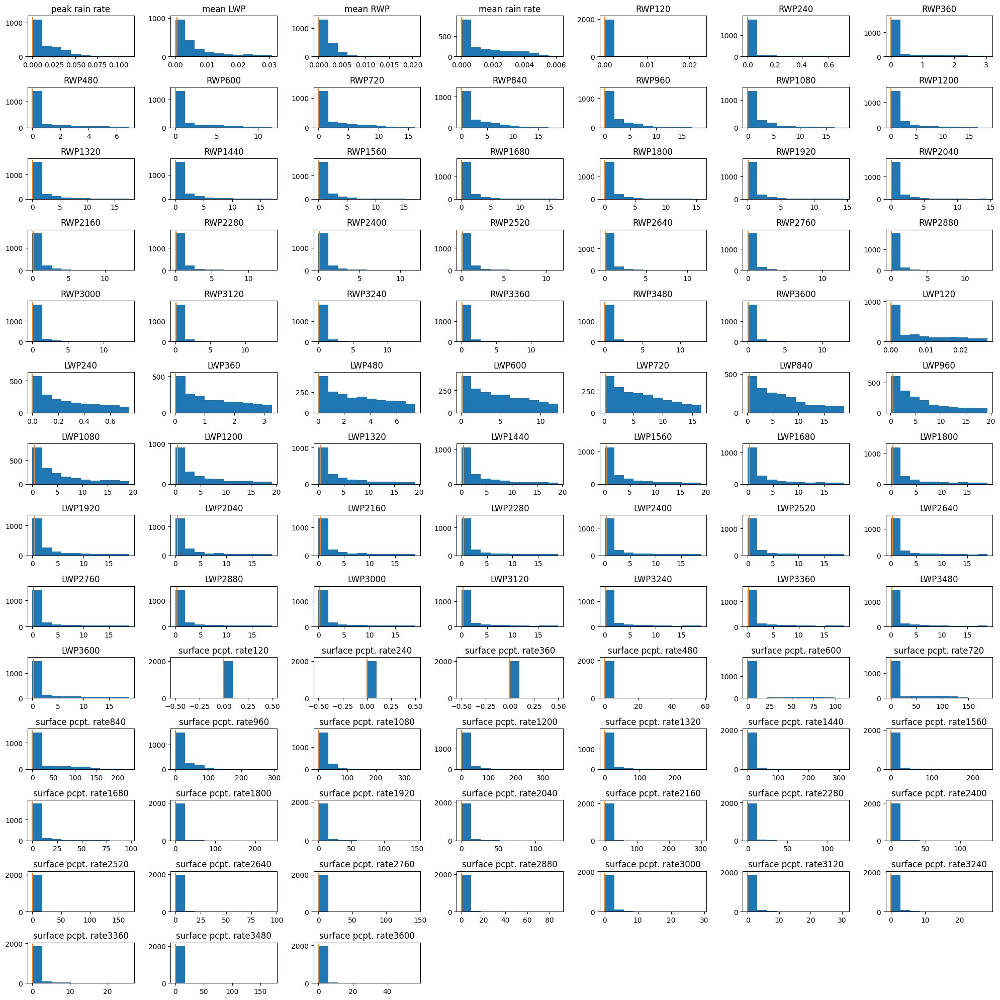

In [21]:
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(14, 7)
ii=1
for i in range(nobs):
    ax = fig.add_subplot(gs[i])
    hst = ax.hist(ppe_vals[:2000,i])
    plt.plot((obs_vals[0,i], obs_vals[0,i]), ax.get_ylim())
    plt.title(ppe_var_names[i])

fig.tight_layout()

In [22]:
import sklearn.model_selection as mod_sec
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import preprocessing

In [23]:
#..normalize the parameters (range 0 to 1) and standardize the obs (standard deviation=1, mean=0)
minmaxscale = preprocessing.MinMaxScaler()
par_norm = minmaxscale.fit_transform(param_vals)

#par_norm = par_norm.feature_range
#..
standscale = preprocessing.StandardScaler().fit(ppe_vals)
fwdobs_stand = standscale.transform(ppe_vals)
print(fwdobs_stand)

[[ 3.14791404  0.29770379  1.65759456 ...  0.58161003  0.23227392
   0.43302557]
 [-0.84303806 -0.77956494 -0.82680408 ... -0.39030883 -0.19027781
  -0.31789032]
 [ 2.22608002  0.37925378  2.17058472 ...  0.66910248  0.26272338
   0.47441221]
 ...
 [-0.69634213 -0.16171501  0.1372315  ...  0.78546702  0.28748402
   0.49330933]
 [-0.84303806  0.15485424 -0.7567042  ... -0.39030883 -0.19027781
  -0.31789032]
 [-0.3300255  -0.7153987  -0.56111457 ... -0.32842885 -0.16426308
  -0.27310061]]


In [24]:
fwdobs_stand.shape

(2000, 94)

In [25]:
print(par_norm.shape)
print(fwdobs_stand.shape)
npar = par_norm.shape[1]
nobs = fwdobs_stand.shape[1]
print(npar,nobs)

(2000, 37)
(2000, 94)
37 94


In [26]:
#..split into training and validation (let's forget about test right now)
par_train, par_val, fwdobs_train, fwdobs_val = mod_sec.train_test_split(par_norm, fwdobs_stand, test_size=0.2, random_state=1)
print(par_train.shape, par_val.shape, fwdobs_train.shape, fwdobs_val.shape)

(1600, 37) (400, 37) (1600, 94) (400, 94)


In [27]:
type(par_train)

numpy.ndarray

## Start training NNs

In [28]:
# Display training progress by printing a single dot for each completed epoch
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('.', end='')

In [29]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mean_absolute_error'],
           label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_absolute_error'],
           label = 'Val Error')
    plt.plot(hist['epoch'],0.1+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.2+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.3+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.4+0.*hist['epoch'],'k:')
    #plt.ylim([0,1])
    plt.legend()

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mean_squared_error'],
           label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_squared_error'],
           label = 'Val Error')
    plt.plot(hist['epoch'],0.1+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.2+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.3+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.4+0.*hist['epoch'],'k:')
    #plt.ylim([0,1])
    plt.legend()
    plt.show()

In [30]:
print(npar)

37


In [31]:
#..Build da model ... standard setup
def build_model_00():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    optimizer = tf.keras.optimizers.RMSprop(0.001)

    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

In [32]:
print(par_train.shape, fwdobs_train.shape)

(1600, 37) (1600, 94)


I0000 00:00:1740105724.300784 2899663 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1312 MB memory:  -> device: 0, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:e1:00.0, compute capability: 8.0
I0000 00:00:1740105725.516902 2907321 service.cc:148] XLA service 0x7fd730009e10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740105725.516932 2907321 service.cc:156]   StreamExecutor device (0): NVIDIA A100 80GB PCIe, Compute Capability 8.0
2025-02-20 21:42:05.548495: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1740105725.613148 2907321 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1740105727.947170 2907321 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

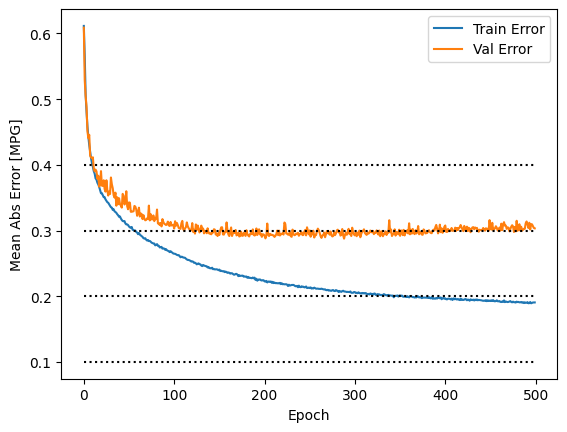

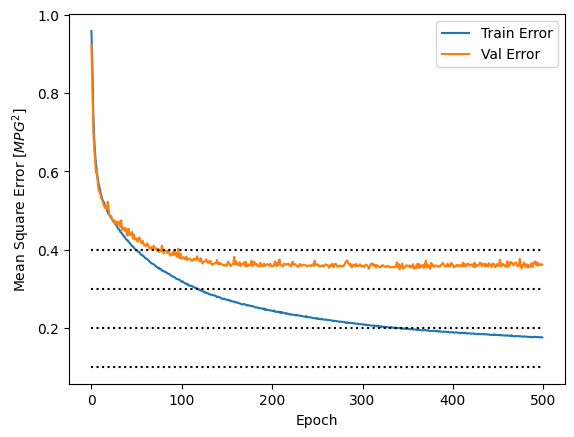

In [33]:
model_00 = build_model_00()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_00.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [34]:
#..Build da model ... deep neural network 01  (looks about the same)
def build_model_01():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.00005)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

2025-02-20 21:46:57.662859: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_381', 4 bytes spill stores, 4 bytes spill loads

2025-02-20 21:46:57.987067: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_383', 24 bytes spill stores, 24 bytes spill loads

2025-02-20 21:46:57.989130: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_383', 68 bytes spill stores, 72 bytes spill loads

2025-02-20 21:46:58.001936: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_383', 60 bytes spill stores, 64 bytes spill loads

2025-02-20 21:46:58.021081: I external/local_xla/xla/stream_execut


.....................

...............................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

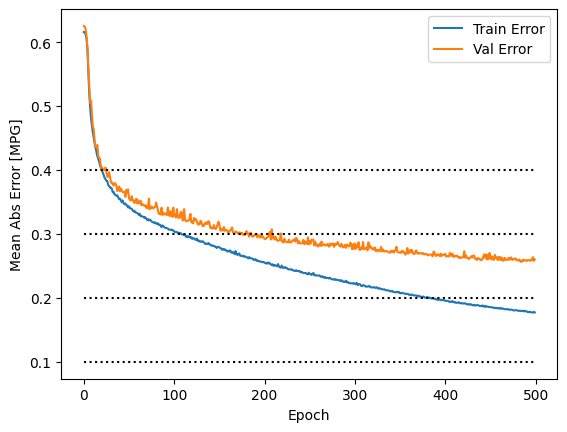

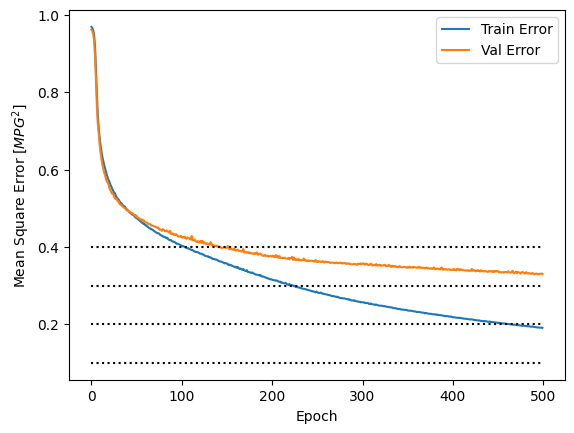

In [35]:
model_01 = build_model_01()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_01.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [36]:
#..Build da model ... deep neural network 02  (looks a bit better)
def build_model_02():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.0001)


    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

In [37]:
model_02 = build_model_02()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_02.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])


...................................

.................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

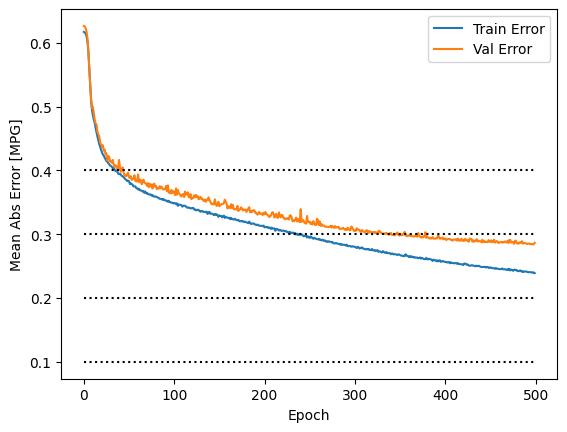

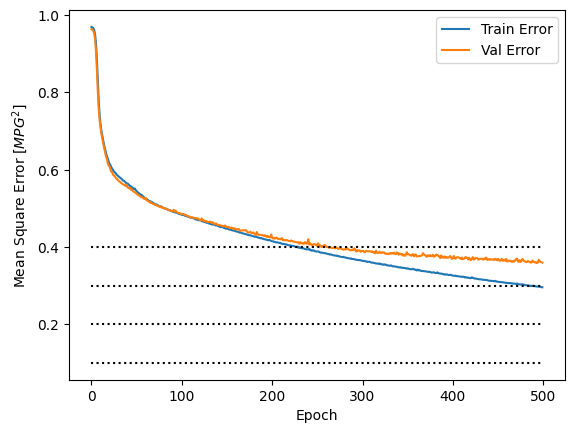

In [38]:
plot_history(history)

In [39]:
#..Build da model ... deep neural network 03 (not any better than 1)
def build_model_03():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.0001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


................................................

....................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

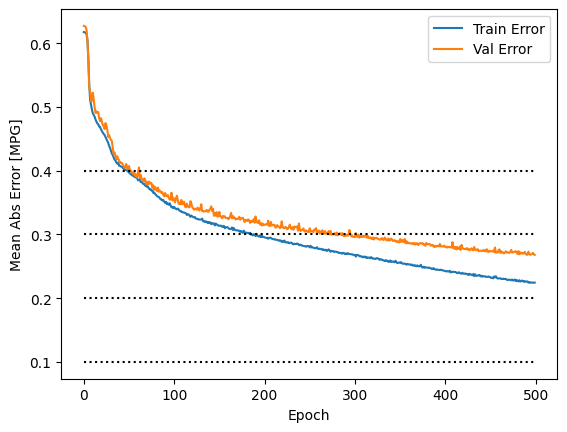

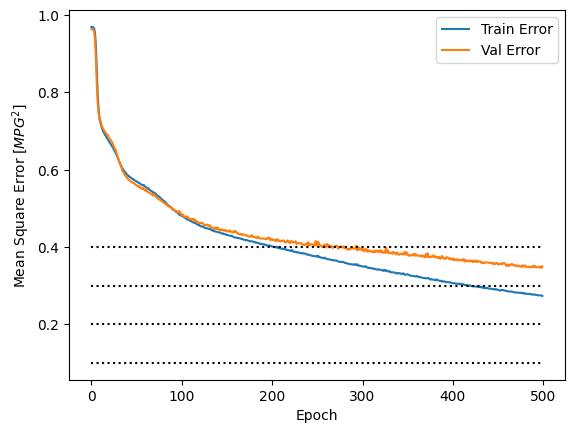

In [40]:
model_03 = build_model_03()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_03.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [41]:
#..Build da model ... deep neural network 04  
def build_model_04():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

2025-02-20 22:01:37.477322: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_328', 4 bytes spill stores, 4 bytes spill loads

2025-02-20 22:01:37.592834: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_330', 60 bytes spill stores, 64 bytes spill loads




........................................................

............................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

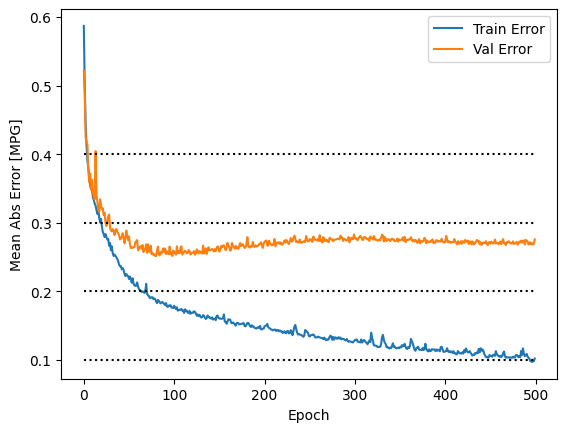

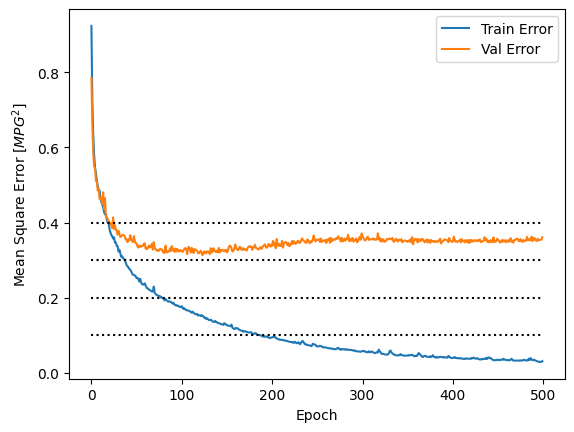

In [42]:
model_04 = build_model_04()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_04.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [43]:
#..Build da model ... deep neural network 05  
def build_model_05():
    def lrelu_01(x): return tf.nn.leaky_relu(x, alpha=0.01)
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


........................................................................

............................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

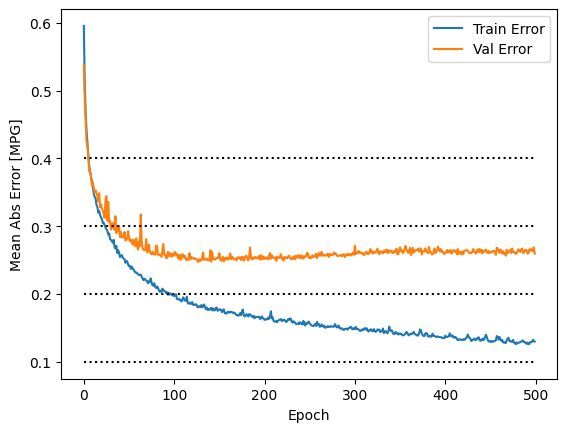

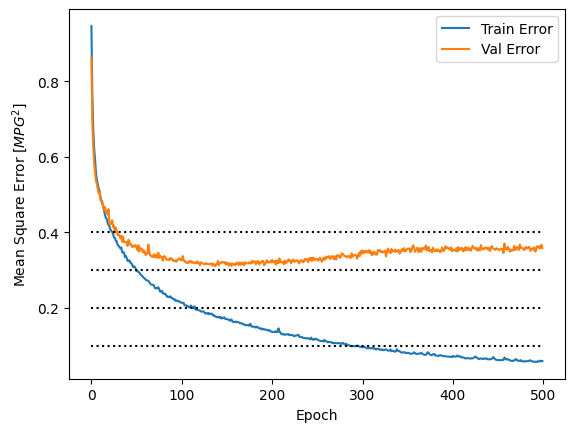

In [44]:
model_05 = build_model_05()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_05.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [45]:
#..Build da model ... deep neural network 06 
def build_model_06():
    def lrelu_01(x): return tf.nn.leaky_relu(x, alpha=0.01)
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


..........................................................................................

..........
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

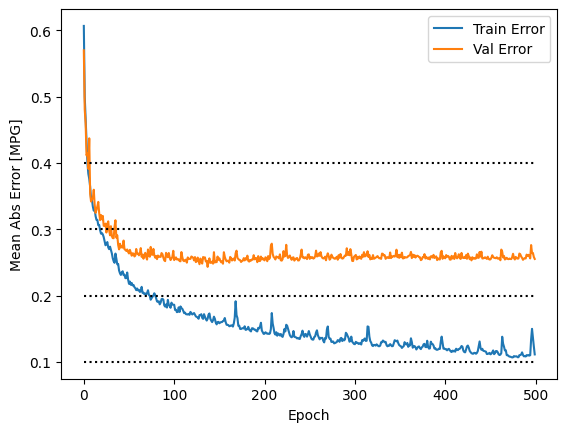

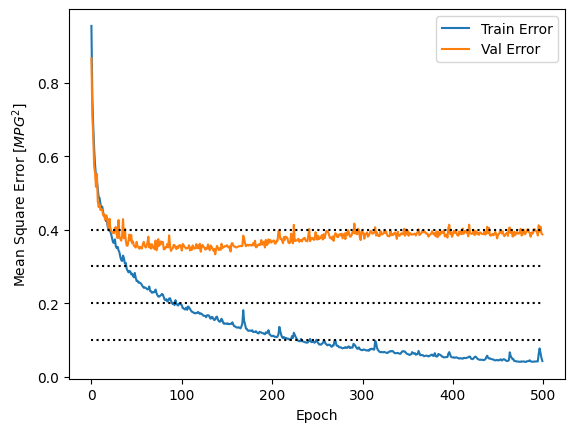

In [46]:
model_06 = build_model_06()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_06.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [47]:
#..Build da model ... deep neural network 07
def build_model_07():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................

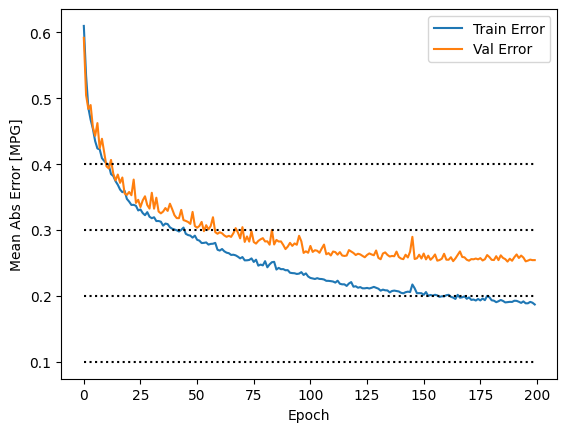

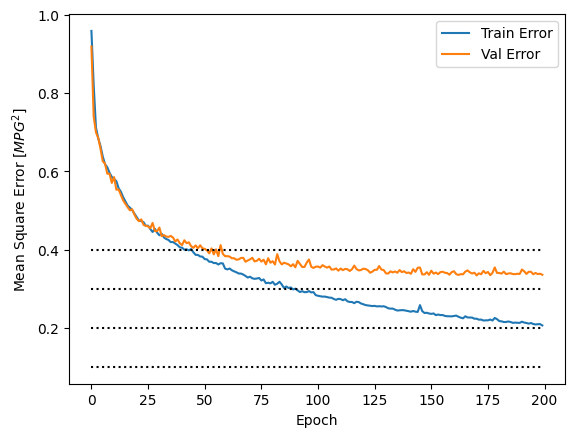

In [48]:
model_07 = build_model_07()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_07.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [49]:
#..Build da model ... deep neural network 08
def build_model_08():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


.....

...............................................................................................
....................................................................................................

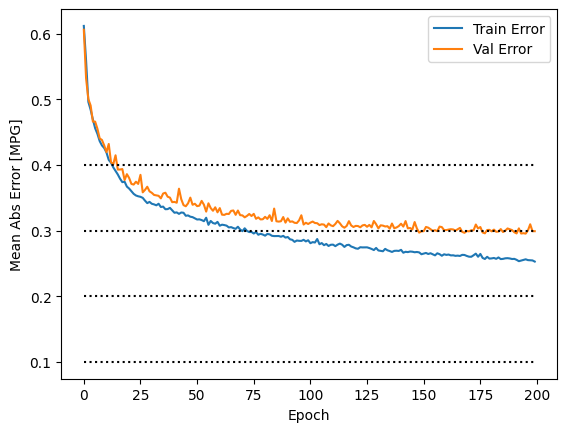

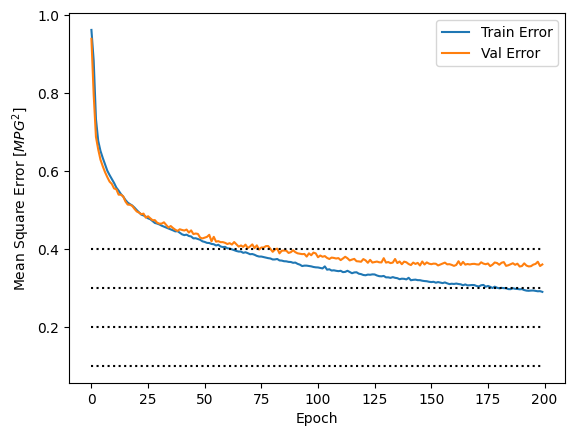

In [50]:
model_08 = build_model_08()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_08.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [51]:
#..Build da model ... deep neural network 09
def build_model_09():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


..........

..........................................................................................
....................................................................................................

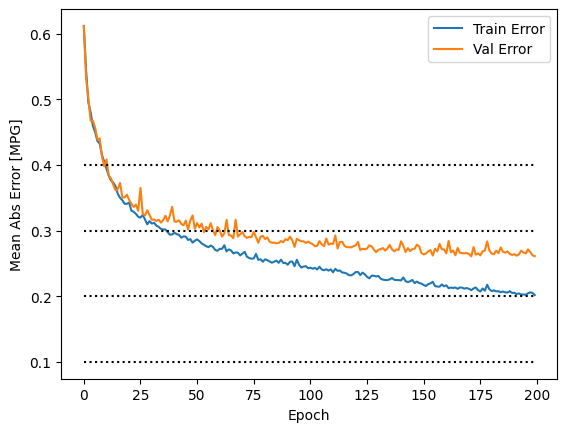

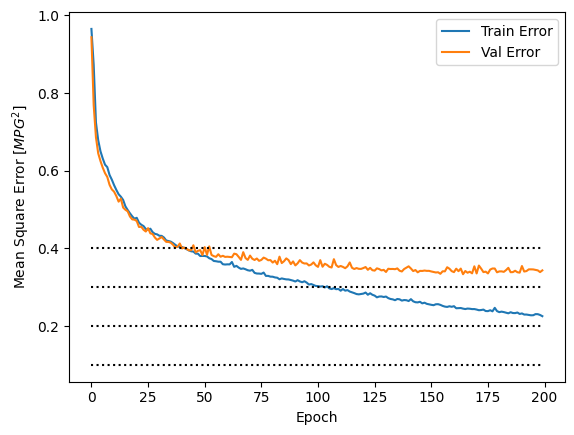

In [52]:
model_09 = build_model_09()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_09.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [53]:
#..Build da model ... deep neural network 09
def build_model_10():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

2025-02-20 22:22:01.605927: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_330', 68 bytes spill stores, 72 bytes spill loads

2025-02-20 22:22:01.615620: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_330', 60 bytes spill stores, 64 bytes spill loads




....................

................................................................................
....................................................................................................

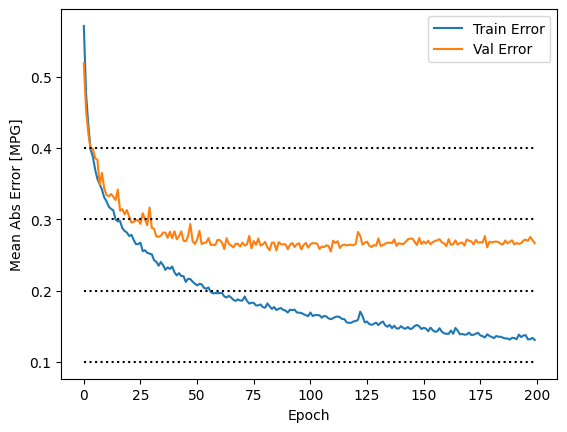

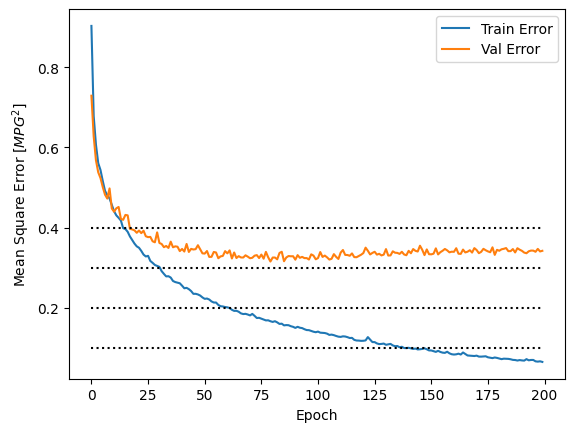

In [54]:
model_10 = build_model_10()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_10.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [55]:
#..Build da model ... deep neural network 09
def build_model_11():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(512, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

2025-02-20 22:23:54.045019: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_385', 68 bytes spill stores, 72 bytes spill loads

2025-02-20 22:23:54.057900: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_257', 48 bytes spill stores, 48 bytes spill loads

2025-02-20 22:23:54.064975: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_385', 60 bytes spill stores, 64 bytes spill loads

2025-02-20 22:23:54.074257: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_385', 24 bytes spill stores, 24 bytes spill loads

2025-02-20 22:23:54.079977: I external/local_xla/xla/stream_exec


.................................

...................................................................
....................................................................................................

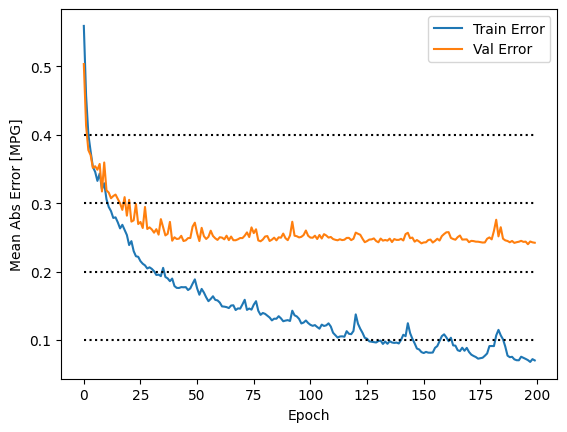

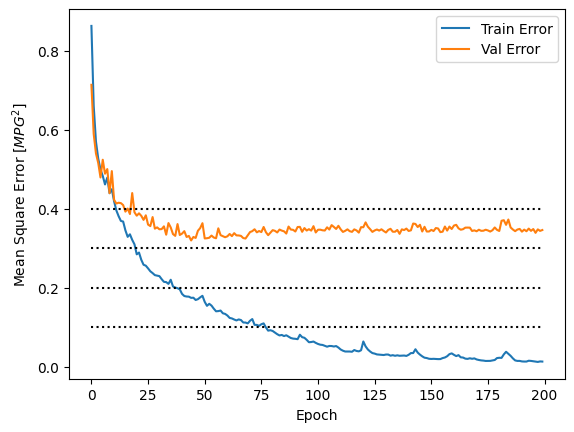

In [56]:
model_11 = build_model_11()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_11.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                    validation_data = [par_val,fwdobs_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

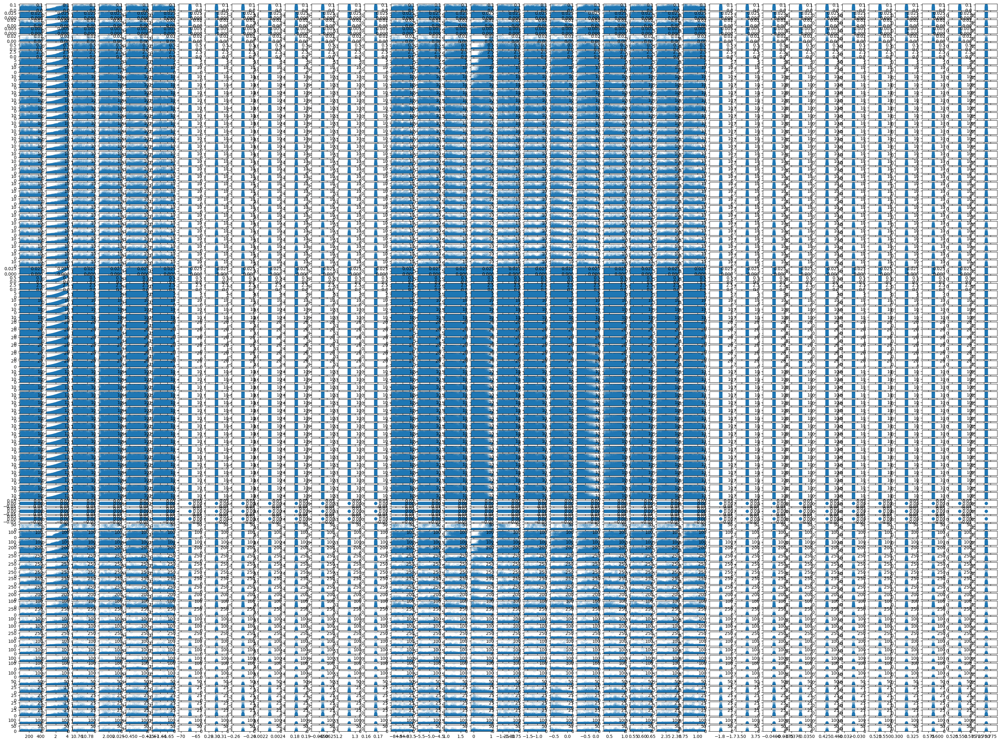

In [57]:
gs = gridspec.GridSpec(nobs,npar)
fig = plt.figure(figsize=(40,30))
for i in range(nobs):
    for j in range(npar):
        ax = fig.add_subplot(gs[i,j])
        ax.scatter(param_vals[:,j],ppe_vals[:,i],alpha=.1)
        #ax.scatter(par_val[:,j],fwdobs_val[:,i],alpha=.1)
        

In [58]:
print(ppe_vals.shape)
print(param_vals.shape)

(2000, 94)
(2000, 37)


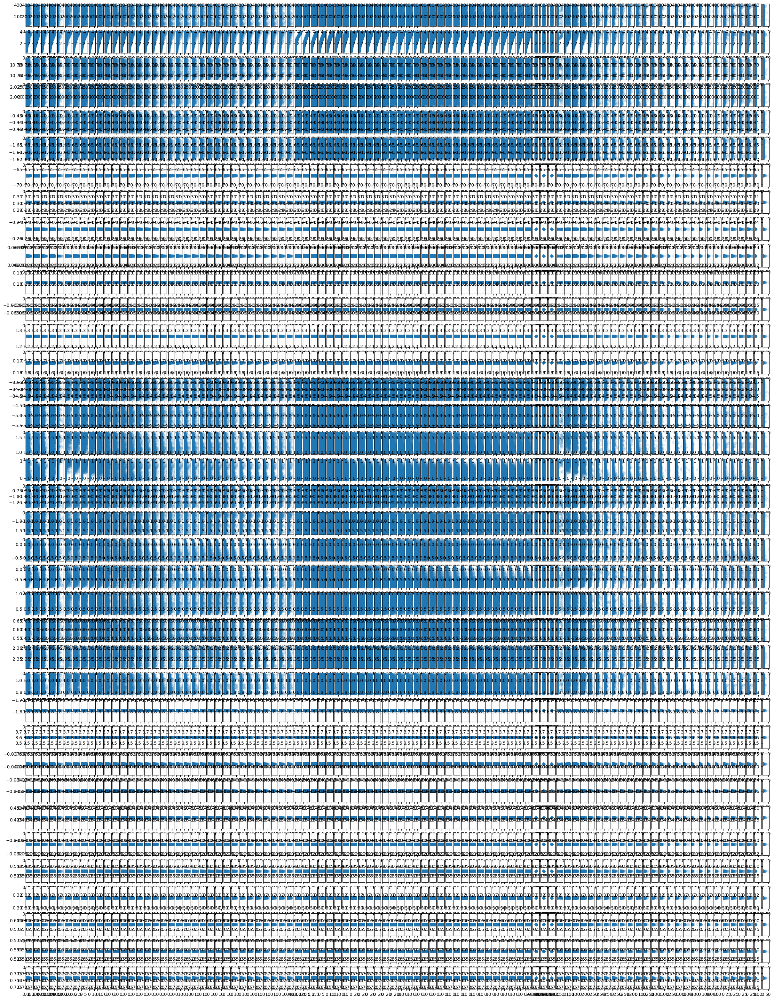

In [59]:
gs = gridspec.GridSpec(npar,nobs)
fig = plt.figure(figsize=(30,40))
for i in range(npar):
    for j in range(nobs):
        ax = fig.add_subplot(gs[i,j])
        ax.scatter(ppe_vals[:,j],param_vals[:,i],alpha=.1)
        #ax.scatter(par_val[:,j],fwdobs_val[:,i],alpha=.1)

## Put everything together and prep for MCMC

In [60]:
model_01 = build_model_01()
model_02 = build_model_02()
model_03 = build_model_03()
model_04 = build_model_04()
model_05 = build_model_05()
model_06 = build_model_06()
model_07 = build_model_07()
model_08 = build_model_08()
model_09 = build_model_09()
model_10 = build_model_10()


................................................

....................................................
....................................................................................................
..

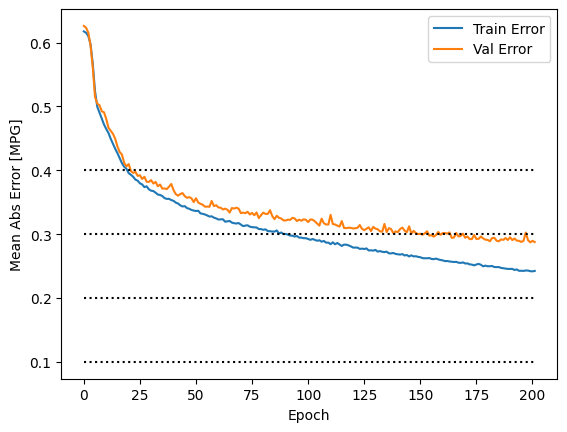

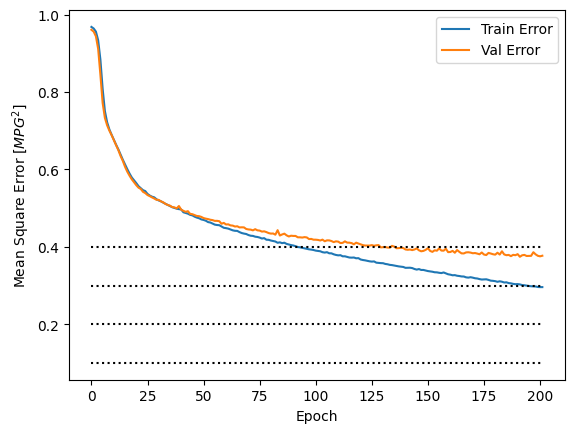


....................................................................................................
....................................................................................................
....................................................................................................
...

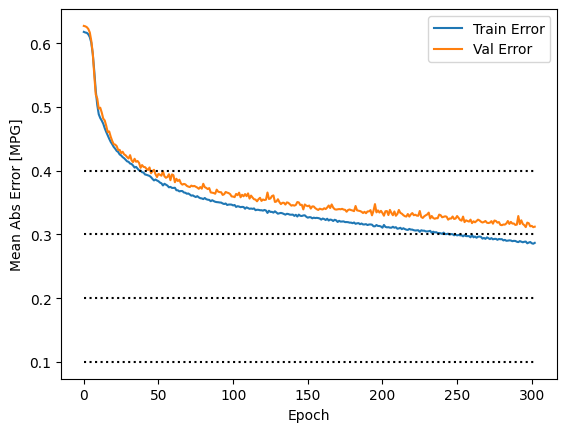

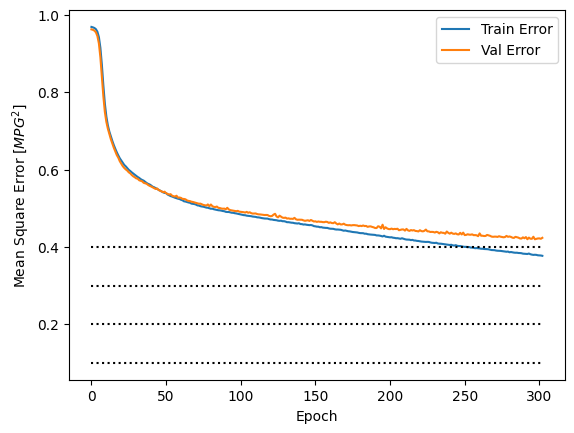


....................................................................................................
....................................................................................................
................

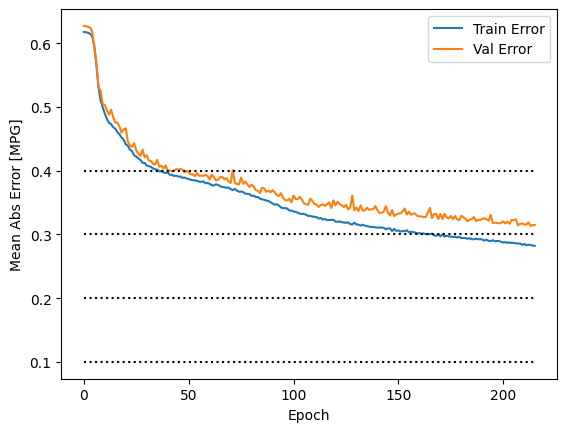

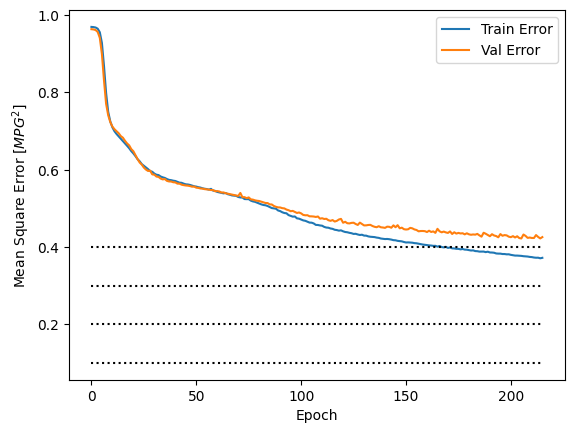


........................................................

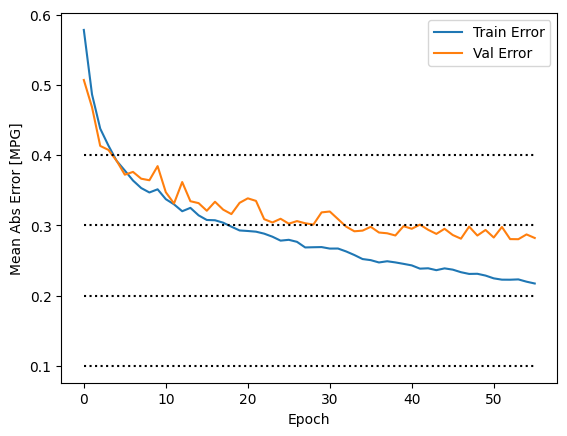

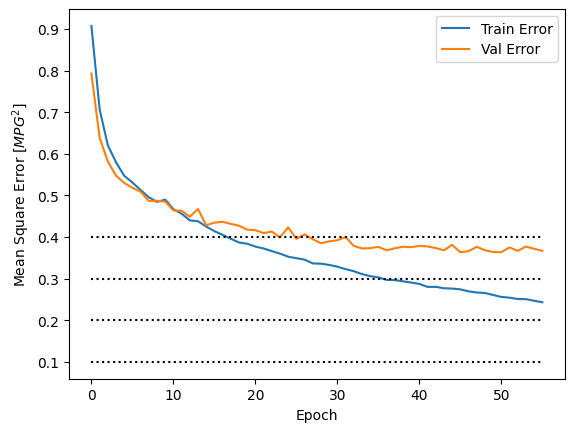


.................................................................

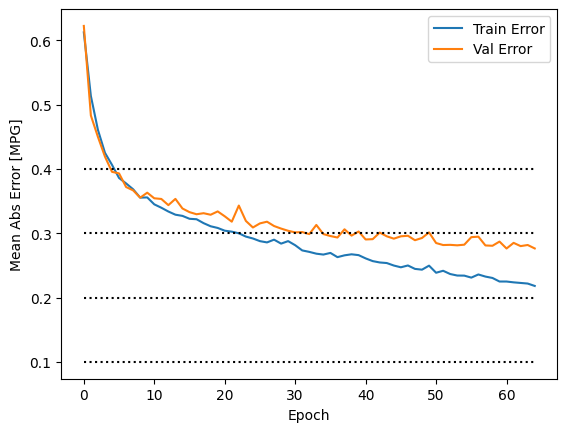

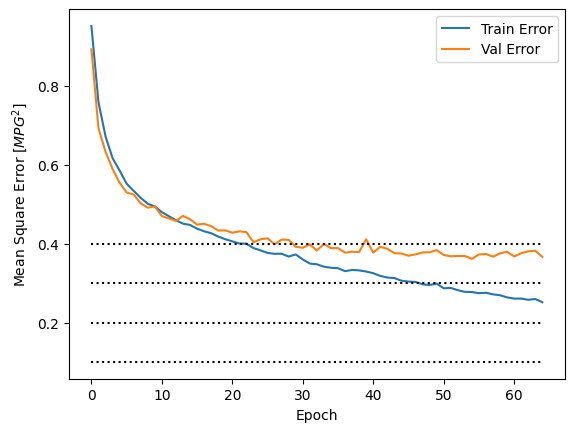


.......................................................................

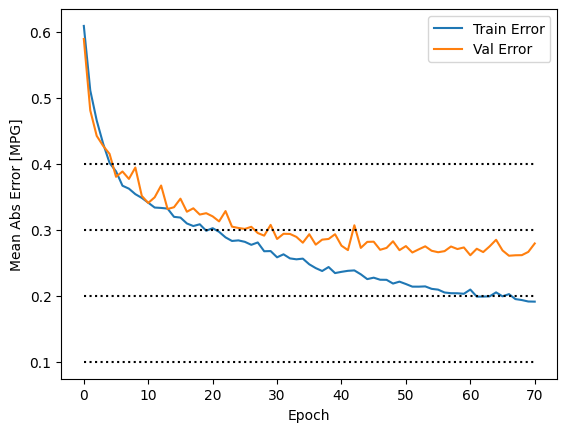

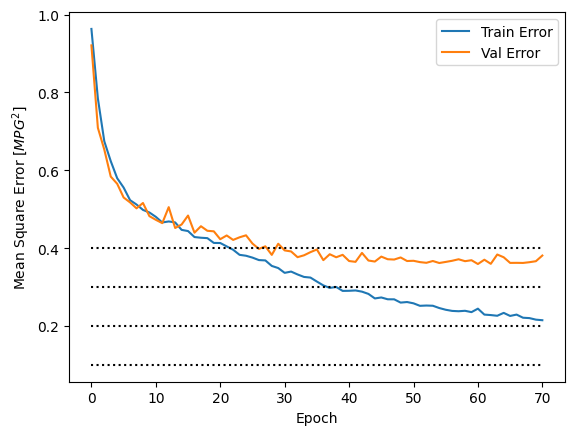


....................................................................................................
...............................

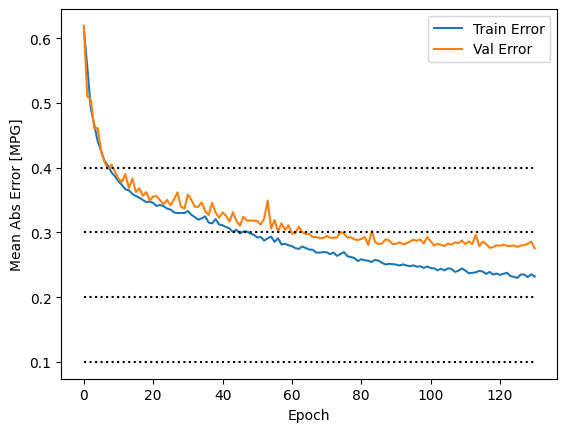

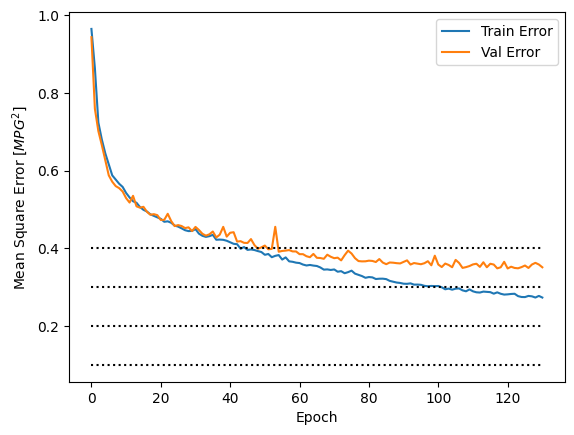


....................................................................................................
......................................

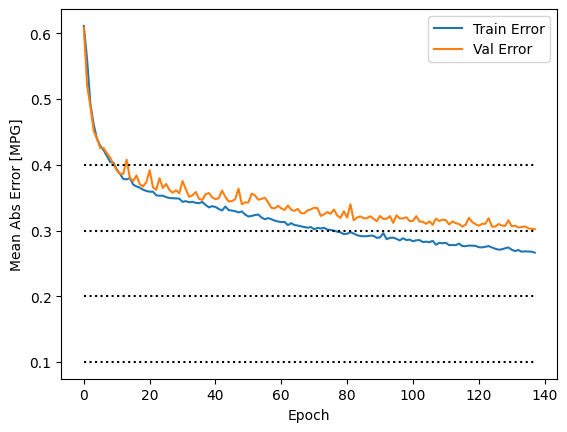

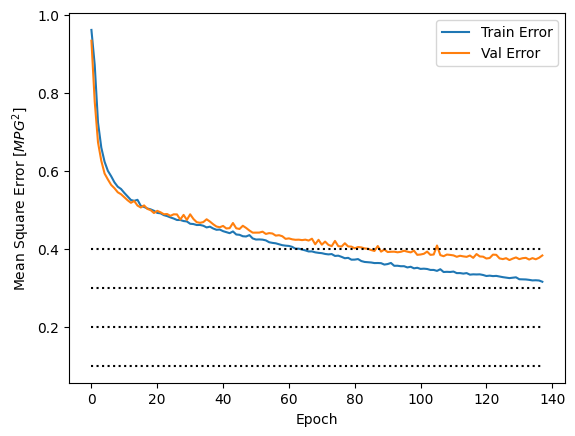


....................................................................................................
.............................................

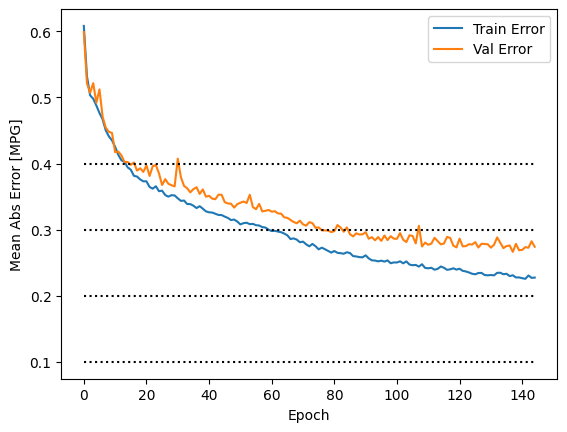

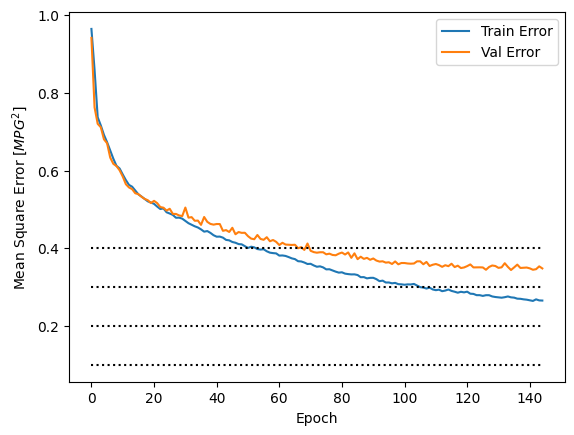


.......................................................

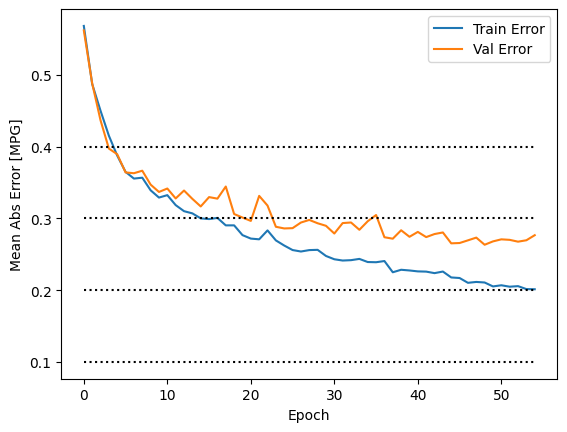

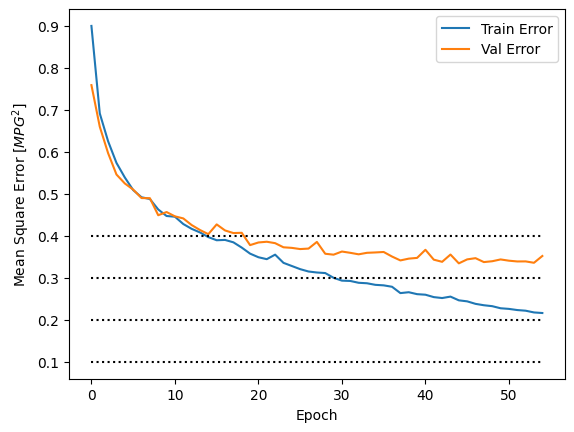

In [61]:
EPOCHS = 1000
modelss = [model_01,model_02,model_03,model_04,model_05,
           model_06,model_07,model_08,model_09,model_10]
# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

for modell in modelss:
    history = modell.fit(par_train, fwdobs_train, epochs=EPOCHS, 
                         validation_data = [par_val,fwdobs_val], 
                         verbose=0,
                         callbacks=[early_stop, PrintDot()])
    plot_history(history)

In [62]:
# average ensemble model 

# import Average layer
from tensorflow.keras.layers import Average 

input = tf.keras.Input(shape=[npar], name='input')  # input layer

# get output for each input model
outputs = [model(input) for model in modelss] 

# take average of the outputs
output = Average()(outputs)

# create average ensembled model
avg_model = tf.keras.Model(input, output)

In [63]:
avg_model

<Functional name=functional_22, built=True>

In [64]:
test_predictions_av = avg_model(par_val)

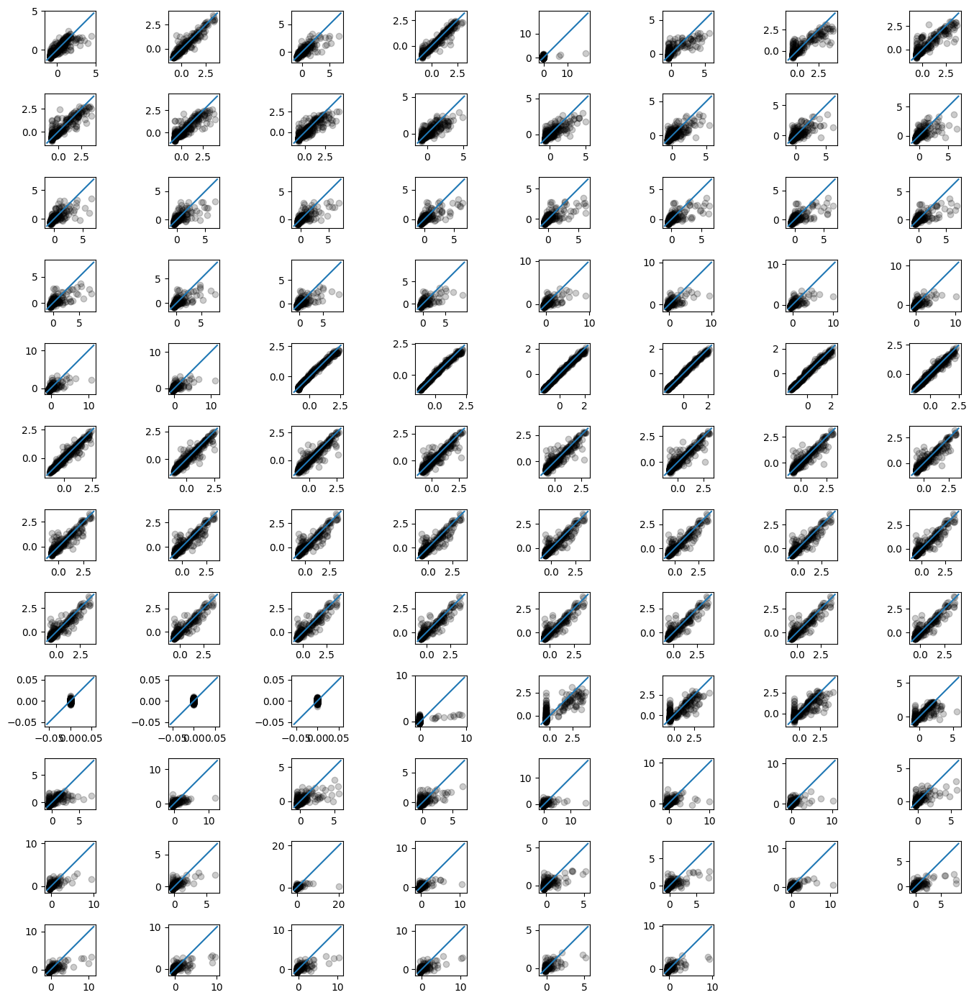

In [69]:
fig = plt.figure(figsize=(14,14))
gs = gridspec.GridSpec(12,8)
ii=1
for i in range(nobs):
    ax = fig.add_subplot(gs[i])
    ax.set_aspect('equal')
    plt.scatter(fwdobs_val[:,i], test_predictions_av[:,i],alpha=0.2,c='k')
    # plt.title(ppe_var_names[i])
    ax_min = min(list(ax.get_ylim() + ax.get_xlim()))
    ax_max = max(list(ax.get_ylim() + ax.get_xlim()))
    plt.plot([ax_min, ax_max], [ax_min, ax_max])
fig.tight_layout()